In [174]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

In [175]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error as mse
from sklearn.model_selection import KFold, GridSearchCV

In [176]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

%config InlineBackend.figure_format = 'svg'
matplotlib.rcParams.update({'font.size': 14})
%matplotlib inline

In [177]:
from inspect import getsource

In [178]:
DEBUG = True
RANDOM_STATE = 45

In [179]:
TRAIN_DATASET_FILE = './train.csv'
TEST_DATASET_FILE = './test.csv'

In [180]:
def fit_feature(df, col, cond, dry=False, suffix=''):
    df = df.copy()
    outliers = df[cond].shape[0]
    total_lines = df.shape[0]

    outlier_feature = f"{col}_{suffix}"

    if not dry and outlier_feature not in df.columns:
        df[outlier_feature] = 0

    if not dry and outliers > 0:
            df.loc[cond & (df[outlier_feature] == 0), outlier_feature] = 1
    
    if DEBUG:
        print(f"Feature: {col}, outliers: {round(100 * outliers / total_lines, 2)}%"
              f" ({outliers}/{total_lines})")
    
    return df

In [181]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("Train metrics",
          f"R2:\t{str(round(r2_score(train_true_values, train_pred_values), 3))}",
          f"RMSE:\t{str(round(np.sqrt(mse(train_true_values, train_pred_values)), 3))}",
          f"MSE:\t{str(round(mse(train_true_values, train_pred_values), 3))}",
          "",
          sep='\n'
         )
    print("Test metrics",
          f"R2:\t{str(round(r2_score(test_true_values, test_pred_values), 3))}",
          f"RMSE:\t{str(round(np.sqrt(mse(test_true_values, test_pred_values)), 3))}",
          f"MSE:\t{str(round(mse(test_true_values, test_pred_values), 3))}",
          "",
          sep='\n'
         )

    
    plt.figure(figsize=(10, 5))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()


In [182]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.
    """
    start_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    for col in df.columns:
        col_type = str(df[col].dtype)

        if col_type != 'object':
            c_min = df[col].min()
            c_max = df[col].max()

            if col_type.startswith('int'):
                i8, i16, i32, i64 = \
                    np.iinfo(np.int8), np.iinfo(np.int16), \
                    np.iinfo(np.int32), np.iinfo(np.int64)

                if c_min >= i8.min and c_max <= i8.max:
                    df[col] = df[col].astype(np.int8)
                elif c_min >= i16.min and c_max <= i16.max:
                    df[col] = df[col].astype(np.int16)
                elif c_min >= i32.min and c_max <= i32.max:
                    df[col] = df[col].astype(np.int32)
                elif c_min >= i64.min and c_max <= i64.max:
                    df[col] = df[col].astype(np.int64)
            elif col_type.startswith('uint'):
                ui8, ui16, ui32, ui64 = \
                    np.iinfo(np.uint8), np.iinfo(np.uint16), \
                    np.iinfo(np.uint32), np.iinfo(np.uint64)

                if c_min >= ui8.min and c_max <= ui8.max:
                    df[col] = df[col].astype(np.uint8)
                elif c_min >= ui16.min and c_max <= ui16.max:
                    df[col] = df[col].astype(np.uint16)
                elif c_min >= ui32.min and c_max <= ui32.max:
                    df[col] = df[col].astype(np.uint32)
                elif c_min >= ui64.min and c_max <= ui64.max:
                    df[col] = df[col].astype(np.uint64)
            elif col_type.startswith('float'):
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
            else:
                # category никак не обрабатываем
                pass
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [183]:
df_train = pd.read_csv(TRAIN_DATASET_FILE)
df_test = pd.read_csv(TEST_DATASET_FILE)

# 

In [184]:
df_train.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


In [185]:
df_train.dtypes

Id                 int64
DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
Price            float64
dtype: object

In [186]:
df_train.nunique()

Id               10000
DistrictId         205
Rooms                9
Square           10000
LifeSquare        7887
KitchenSquare       58
Floor               33
HouseFloor          44
HouseYear           97
Ecology_1          129
Ecology_2            2
Ecology_3            2
Social_1            51
Social_2           142
Social_3            30
Healthcare_1        79
Helthcare_2          7
Shops_1             16
Shops_2              2
Price            10000
dtype: int64

In [187]:
df_train.isna().sum()

Id                  0
DistrictId          0
Rooms               0
Square              0
LifeSquare       2113
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1     4798
Helthcare_2         0
Shops_1             0
Shops_2             0
Price               0
dtype: int64

In [188]:
df_test.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1
count,5000.000000,5000.000000,5000.000000,5000.000000,3959.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,2623.000000,5000.00000,5000.000000
mean,8412.595400,51.279200,1.910000,56.449500,36.158810,5.976800,8.632000,12.601000,1984.392600,0.119874,24.933800,5406.900000,8.262600,1146.657263,1.31940,4.242800
std,4832.674037,44.179466,0.838594,19.092787,17.825287,9.950018,5.483228,6.789213,18.573149,0.120070,17.532202,4026.614773,23.863762,1044.744231,1.47994,4.777365
min,1.000000,0.000000,0.000000,1.378543,0.333490,0.000000,1.000000,0.000000,1908.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.00000,0.000000
25%,4221.750000,21.000000,1.000000,41.906231,23.092026,1.000000,4.000000,9.000000,1973.000000,0.019509,6.000000,1564.000000,0.000000,325.000000,0.00000,1.000000
50%,8320.500000,37.000000,2.000000,52.921340,32.925087,6.000000,7.000000,12.000000,1977.000000,0.072158,25.000000,5285.000000,2.000000,900.000000,1.00000,3.000000
75%,12598.250000,77.000000,2.000000,66.285129,45.174091,9.000000,12.000000,17.000000,2000.000000,0.195781,36.000000,7287.000000,5.000000,1548.000000,2.00000,6.000000
max,16795.000000,212.000000,17.000000,223.453689,303.071094,620.000000,78.000000,99.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.00000,23.000000


In [189]:
df_test.dtypes

Id                 int64
DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
dtype: object

In [190]:
df_test.nunique()

Id               5000
DistrictId        201
Rooms               8
Square           5000
LifeSquare       3959
KitchenSquare      38
Floor              35
HouseFloor         41
HouseYear          97
Ecology_1         130
Ecology_2           2
Ecology_3           2
Social_1           51
Social_2          143
Social_3           30
Healthcare_1       79
Helthcare_2         7
Shops_1            16
Shops_2             2
dtype: int64

In [191]:
df_test.isna().sum()

Id                  0
DistrictId          0
Rooms               0
Square              0
LifeSquare       1041
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1     2377
Helthcare_2         0
Shops_1             0
Shops_2             0
dtype: int64

In [192]:
df_train.shape[1] - df_test.shape[1]

1

### Предобработка

In [193]:
# данные должны отвечать своему содержимому
valid_feature_types = {
    'Id': str,
    'DistrictId': str,
    'Rooms': np.uint8,
    'HouseFloor': np.uint8,
}

df_train = df_train.astype(valid_feature_types)
df_test = df_test.astype(valid_feature_types)

In [194]:
df_train = reduce_mem_usage(df_train)

Memory usage of dataframe is 1.39 MB
Memory usage after optimization is: 0.83 MB
Decreased by 40.4%


In [195]:
df_test = reduce_mem_usage(df_test)

Memory usage of dataframe is 0.66 MB
Memory usage after optimization is: 0.39 MB
Decreased by 40.4%


###  Анализ целевой переменной Price

In [196]:
df_train.Price.value_counts()

298194.500000    2
182938.078125    2
204576.421875    2
238608.656250    2
475135.937500    1
                ..
197375.453125    1
146084.593750    1
176104.843750    1
133795.843750    1
167936.046875    1
Name: Price, Length: 9996, dtype: int64

In [197]:
X = df_train.drop('Price', axis=1)
y = df_train.Price

### количественные характеристики

In [198]:
real_features = df_train.drop('Price', axis=1).select_dtypes(exclude='category').columns.tolist()
real_features

['Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1']

### категориальные характеристики

In [199]:
cat_features = df_train.select_dtypes(include='category').columns.tolist()
cat_features

['Id', 'DistrictId', 'Ecology_2', 'Ecology_3', 'Shops_2']

### визуализация вещественных характеристик

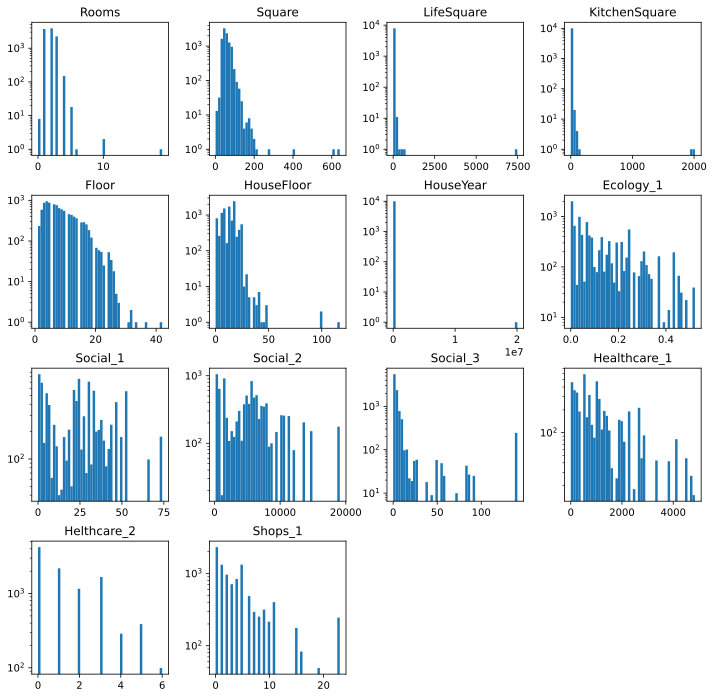

In [200]:
df_train[real_features].hist(figsize=(12,12), grid=False, bins=50, log=True)
plt.show()

### категориальные признаки

In [201]:
for col in cat_features:
    print(col, df_train[col].value_counts(), '\n', sep='\n')

Id
9999     1
15027    1
15038    1
15037    1
15036    1
        ..
4921     1
4920     1
4918     1
4916     1
0        1
Name: Id, Length: 10000, dtype: int64


DistrictId
27     851
1      652
23     565
6      511
9      294
      ... 
205      1
207      1
209      1
117      1
174      1
Name: DistrictId, Length: 205, dtype: int64


Ecology_2
B    9903
A      97
Name: Ecology_2, dtype: int64


Ecology_3
B    9725
A     275
Name: Ecology_3, dtype: int64


Shops_2
B    9175
A     825
Name: Shops_2, dtype: int64




## Обработка выбросов

In [202]:
MIN_ROOMS = 0
MAX_ROOMS = 5
MIN_SQUARE = 20
MAX_SQUARE = 300


### Rooms

In [203]:
df_train.Rooms.value_counts()

2     3880
1     3705
3     2235
4      150
5       18
0        8
10       2
6        1
19       1
Name: Rooms, dtype: int64

### df_train.Rooms <= 0 | df_train.Rooms > 5 cases

In [204]:
rooms_outlier_cond = (df_train.Rooms <= MIN_ROOMS) | (df_train.Rooms > MAX_ROOMS)

In [205]:
df_train = fit_feature(df_train, 'Rooms', rooms_outlier_cond, suffix='outlier')

Feature: Rooms, outliers: 0.12% (12/10000)


In [206]:
df_train['cat_Square'] = df_train.Square // 10 * 10

square_cond = (df_train.Square >= MIN_SQUARE) & (df_train.Square <= MAX_SQUARE)
med_rooms_by_square = df_train[~rooms_outlier_cond & square_cond]\
    .groupby('cat_Square').agg({'Rooms': 'median'}).to_dict()['Rooms']
# med_rooms_by_square

In [207]:
df_train.loc[rooms_outlier_cond, 'Rooms'] = \
    df_train[rooms_outlier_cond].cat_Square.map(med_rooms_by_square)

In [208]:
df_train.Rooms.fillna(df_train.Rooms.median(), inplace=True)

In [209]:
df_train.Rooms.mean(), df_train.Rooms.quantile(.5), df_train.shape[0]

(1.8883, 2.0, 10000)

мода с медианой близко

### Square

In [210]:
square_base_cond = \
    (~df_train.Square.isna()) \
    & (~df_train.LifeSquare.isna()) \
    & (~df_train.KitchenSquare.isna())

In [211]:
df_train.Square.describe()

count    10000.000000
mean        56.315720
std         21.058716
min          1.136859
25%         41.774879
50%         52.513309
75%         65.900627
max        641.065186
Name: Square, dtype: float64

In [212]:
df_train.value_counts().shape

(4457,)

In [213]:
# квартира не может быть меньше 24 квм
square_outlier_cond = (df_train.Square < MIN_SQUARE) | (df_train.Square >= MAX_SQUARE)

In [214]:
df_train = fit_feature(df_train, 'Square', square_outlier_cond, suffix='outlier')

Feature: Square, outliers: 0.24% (24/10000)


In [215]:
med_square_by_rooms = df_train[~square_outlier_cond]\
    .groupby('Rooms').agg({'Square': 'median'}).to_dict()['Square']
med_square_by_rooms

{1.0: 40.43013000488281,
 2.0: 55.85613250732422,
 3.0: 77.44389343261719,
 4.0: 98.66806030273438,
 5.0: 116.0848617553711}

In [216]:
df_train.loc[square_outlier_cond, 'Square'] = \
    df_train[square_outlier_cond].Rooms.map(med_square_by_rooms)

In [217]:
m = df_train.median()
m.Square

52.53990936279297

In [218]:
df_train.Square.mean(), df_train.Square.quantile(.5), df_train.shape[0]

(56.24973678588867, 52.53990936279297, 10000)

In [219]:
df_train.quantile(.025)

Rooms                 1.000000
Square               32.283989
LifeSquare            5.914130
KitchenSquare         0.000000
Floor                 2.000000
HouseFloor            0.000000
HouseYear          1959.000000
Ecology_1             0.000000
Social_1              1.000000
Social_2            264.000000
Social_3              0.000000
Healthcare_1         30.000000
Helthcare_2           0.000000
Shops_1               0.000000
Price             87244.382812
Rooms_outlier         0.000000
cat_Square           30.000000
Square_outlier        0.000000
Name: 0.025, dtype: float64

### LifeSquare

In [220]:
df_train.LifeSquare.describe()

count    7887.000000
mean       37.199665
std        86.241219
min         0.370619
25%        22.769833
50%        32.781261
75%        45.128803
max      7480.592285
Name: LifeSquare, dtype: float64

In [221]:
df_train.LifeSquare.quantile(.025), df_train.LifeSquare.quantile(.975)

(5.9141297, 80.7481)

In [222]:
(df_train.LifeSquare // 10 * 10).value_counts()

20.0      2202
30.0      2074
40.0      1505
10.0       711
50.0       509
60.0       313
0.0        205
70.0       158
80.0       111
90.0        37
100.0       24
110.0       10
120.0        9
130.0        4
160.0        4
170.0        2
210.0        1
460.0        1
150.0        1
410.0        1
630.0        1
260.0        1
230.0        1
200.0        1
7480.0       1
Name: LifeSquare, dtype: int64

#### df_train.LifeSquare < df_train.LifeSquare.quantile(.025) case

In [223]:
lsquare_outlier_lq_cond = (df_train.LifeSquare < df_train.LifeSquare.quantile(.025))
df_train = fit_feature(df_train, 'LifeSquare', lsquare_outlier_lq_cond, suffix='outlier')

Feature: LifeSquare, outliers: 1.98% (198/10000)


In [224]:
df_train.loc[lsquare_outlier_lq_cond, 'LifeSquare'] = df_train.LifeSquare.quantile(.025)

#### df_train.LifeSquare > df_train.Square cases

In [225]:
lsquares_outlier_cond = df_train.LifeSquare > (df_train.Square - 5)
df_train = fit_feature(df_train, 'LifeSquare', lsquares_outlier_cond, suffix='outlier')

Feature: LifeSquare, outliers: 11.57% (1157/10000)


In [226]:
lsquare_valid_cond = \
    ~lsquares_outlier_cond \
    & (df_train.Rooms_outlier == 0) \
    & (df_train.Square_outlier == 0) \
    & (df_train.LifeSquare_outlier == 0) \
    & (~df_train.Square.isna()) \
    & (~df_train.LifeSquare.isna()) \
    & (~df_train.KitchenSquare.isna())

include_columns = [
    'Rooms',
    'Square',
    'LifeSquare',
]

df_lsquare = df_train.loc[lsquare_valid_cond, include_columns]
df_lsquare.shape

(6519, 3)

In [227]:
ls_X_train, ls_X_test, ls_y_train, ls_y_test = train_test_split(
    df_lsquare.drop(columns=['LifeSquare']),
    df_lsquare.LifeSquare,
    test_size=.3,
    random_state=RANDOM_STATE
)

пробуем линейную регрессию

In [228]:
ls_lr_model = LinearRegression(normalize=True)
ls_fit_lr_model = ls_lr_model.fit(ls_X_train, ls_y_train)

Train metrics
R2:	0.875
RMSE:	4.459
MSE:	19.879

Test metrics
R2:	0.874
RMSE:	4.522
MSE:	20.449



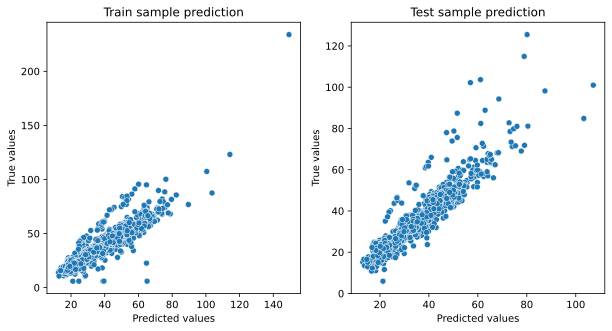

In [229]:
evaluate_preds(
    ls_y_train, ls_fit_lr_model.predict(ls_X_train),
    ls_y_test, ls_fit_lr_model.predict(ls_X_test),
)

пробуем случайный лес

100 x 15 = 0.967 0.876

100 x 10 = 0.942 0.889

100 x 9 = 0.934 0.892

100 x 7 = 0.916 0.895

90 x 9 = 0.934 0.892

In [230]:
ls_rf_model = RandomForestRegressor(
    n_estimators=90,
    max_depth=9,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
ls_fit_rf_model = ls_rf_model.fit(ls_X_train, ls_y_train)

Train metrics
R2:	0.934
RMSE:	3.247
MSE:	10.543

Test metrics
R2:	0.892
RMSE:	4.191
MSE:	17.563



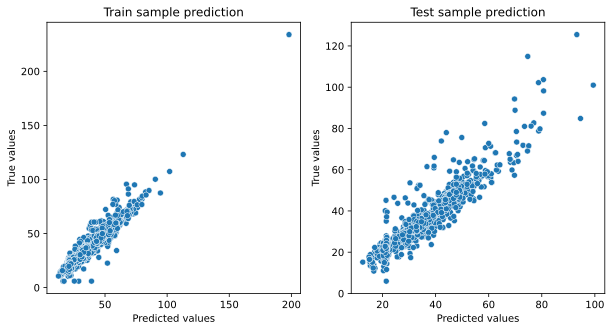

In [231]:
evaluate_preds(
    ls_y_train, ls_fit_rf_model.predict(ls_X_train),
    ls_y_test, ls_fit_rf_model.predict(ls_X_test),
)

для исправления выбросов выбираем модель RandomForest

In [232]:
lsquare_outlier_dataset = df_train.loc[
    lsquares_outlier_cond,
    include_columns
]

In [233]:
df_train.loc[lsquares_outlier_cond, 'LifeSquare'] = \
    ls_fit_rf_model.predict(lsquare_outlier_dataset.drop(columns=['LifeSquare']))

In [234]:
_ = fit_feature(
    df_train,
    'LifeSquare',
    df_train.LifeSquare > (df_train.Square - 5),
    dry=True
)

Feature: LifeSquare, outliers: 0.0% (0/10000)


неисправленные наблюдения исправляем на median

In [235]:
df_train.loc[df_train.LifeSquare > (df_train.Square - 5), 'LifeSquare'] = df_train.LifeSquare.median()

In [236]:
df_train.LifeSquare.mean(), \
df_train.LifeSquare.quantile(.5), \
df_train.shape[0]

(32.3984260559082, 31.134361, 10000)

### KitchenSquare

<AxesSubplot:>

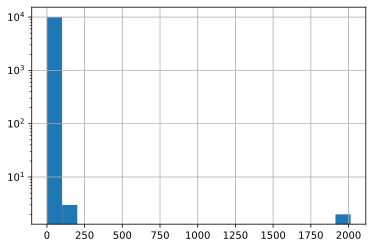

In [237]:
df_train.KitchenSquare.hist(log=True, bins=20)

In [238]:
df_train.KitchenSquare.describe()

count    10000.000000
mean         6.273300
std         28.560839
min          0.000000
25%          1.000000
50%          6.000000
75%          9.000000
max       2014.000000
Name: KitchenSquare, dtype: float64

In [239]:
df_train.KitchenSquare.value_counts()

1.0       2460
8.0       1306
5.0       1169
10.0      1075
6.0       1038
9.0        843
0.0        697
7.0        609
12.0       249
11.0       233
13.0        67
14.0        51
4.0         39
15.0        31
3.0         22
16.0        16
20.0        14
17.0        12
19.0        11
18.0         6
2.0          4
22.0         3
43.0         2
112.0        2
41.0         2
32.0         2
58.0         2
25.0         2
37.0         2
30.0         2
51.0         2
40.0         1
96.0         1
48.0         1
72.0         1
73.0         1
2014.0       1
66.0         1
36.0         1
78.0         1
54.0         1
29.0         1
31.0         1
35.0         1
62.0         1
39.0         1
1970.0       1
60.0         1
75.0         1
26.0         1
21.0         1
84.0         1
63.0         1
123.0        1
53.0         1
42.0         1
23.0         1
27.0         1
Name: KitchenSquare, dtype: int64

In [240]:
df_train = fit_feature(df_train, 'KitchenSquare', df_train.KitchenSquare > 100, suffix='outlier')

Feature: KitchenSquare, outliers: 0.05% (5/10000)


удаляем 5 наблюдений с df_train.KitchenSquare > 100

In [241]:
df_train.loc[df_train.KitchenSquare > 100, 'KitchenSquare'] = df_train.KitchenSquare.median()

### df_train.KitchenSquare <= 5 case

In [242]:
df_train = fit_feature(df_train, 'KitchenSquare', df_train.KitchenSquare < 5, suffix='outlier')

Feature: KitchenSquare, outliers: 32.22% (3222/10000)


In [243]:
valid_kitchensquare_cond = \
    (df_train.KitchenSquare >= 5) \
    & (df_train.Rooms_outlier == 0) \
    & (df_train.Square_outlier == 0) \
    & (df_train.LifeSquare_outlier == 0) \
    & (df_train.KitchenSquare_outlier == 0) \
    & (~df_train.Square.isna()) \
    & (~df_train.LifeSquare.isna()) \
    & (~df_train.KitchenSquare.isna())

ks_include_columns = [
    'Rooms',
    'Square',
    'LifeSquare',
    'KitchenSquare',
    'Price',
]
df_ksquare = df_train.loc[valid_kitchensquare_cond, ks_include_columns]
X_ksquare = df_ksquare.drop(columns=['KitchenSquare'])
X_ksquare.shape

(6295, 4)

In [244]:
X_ks_train, X_ks_test, y_ks_train, y_ks_test = \
    train_test_split(X_ksquare, df_ksquare.KitchenSquare, test_size=.3, random_state=RANDOM_STATE, shuffle=True)

пробуем линейную регрессию

In [245]:
ks_lr_model = LinearRegression(normalize=True)
fitted_ks_lr_model = ks_lr_model.fit(X_ks_train, y_ks_train)

Train metrics
R2:	0.405
RMSE:	2.388
MSE:	5.704

Test metrics
R2:	0.364
RMSE:	2.864
MSE:	8.202



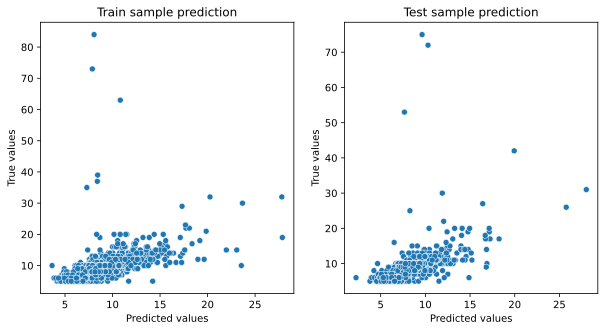

In [246]:
evaluate_preds(
    y_ks_train, fitted_ks_lr_model.predict(X_ks_train),
    y_ks_test, fitted_ks_lr_model.predict(X_ks_test),
)

пробуем случайный лес

In [247]:
ks_rf_model = RandomForestRegressor(
    n_estimators=500,
    max_depth=4,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
fitted_ks_rf_model = ks_rf_model.fit(X_ks_train, y_ks_train)

Train metrics
R2:	0.467
RMSE:	2.261
MSE:	5.11

Test metrics
R2:	0.333
RMSE:	2.932
MSE:	8.599



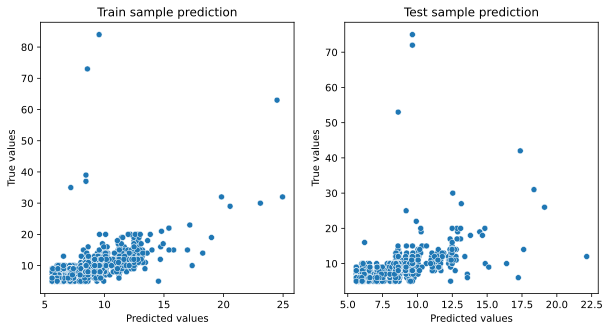

In [248]:
evaluate_preds(
    y_ks_train, fitted_ks_rf_model.predict(X_ks_train),
    y_ks_test, fitted_ks_rf_model.predict(X_ks_test),
)

In [249]:
df_train.drop(columns=['KitchenSquare', 'KitchenSquare_outlier'], inplace=True)

### Floor

In [250]:
df_train.Floor.describe()

count    10000.000000
mean         8.526700
std          5.241148
min          1.000000
25%          4.000000
50%          7.000000
75%         12.000000
max         42.000000
Name: Floor, dtype: float64

In [251]:
df_train.Floor.value_counts()

4     949
5     876
3     872
6     802
7     759
8     643
9     604
2     588
10    553
11    457
12    438
13    398
14    362
16    290
15    287
17    256
1     235
18    185
19    121
20     68
21     59
22     54
24     53
25     34
23     25
26     18
27      5
28      3
32      2
42      1
33      1
37      1
31      1
Name: Floor, dtype: int64

In [252]:
df_train = fit_feature(df_train, 'Floor', df_train.Floor > df_train.HouseFloor, suffix='outlier')

Feature: Floor, outliers: 18.25% (1825/10000)


In [253]:
df_train.loc[df_train.Floor > df_train.HouseFloor, ['Floor', 'HouseFloor']] = \
    df_train.loc[df_train.Floor > df_train.HouseFloor, ['HouseFloor', 'Floor']].values

In [254]:
df_train.Floor.max(), \
df_train.Floor.mean(), \
df_train.Floor.quantile(.5), \
df_train.shape[0]

(42.0, 7.7004, 7.0, 10000)

### HouseFloor

In [255]:
df_train.HouseFloor.describe()

count    10000.000000
mean        13.435700
std          6.094012
min          1.000000
25%          9.000000
50%         14.000000
75%         17.000000
max        117.000000
Name: HouseFloor, dtype: float64

In [256]:
df_train.HouseFloor.value_counts()

17.0     2247
9.0      1284
12.0     1018
5.0       892
14.0      650
16.0      572
25.0      382
22.0      342
10.0      294
6.0       261
4.0       210
18.0      204
7.0       199
24.0      186
19.0      169
15.0      164
8.0       162
3.0       135
11.0      131
13.0      130
20.0      118
2.0        60
21.0       49
23.0       39
30.0       21
1.0        20
26.0       17
27.0       11
40.0        7
32.0        4
37.0        4
28.0        4
48.0        2
99.0        2
39.0        2
31.0        1
29.0        1
44.0        1
36.0        1
45.0        1
47.0        1
117.0       1
38.0        1
Name: HouseFloor, dtype: int64

#### (df_train.HouseFloor > 50) | (df_train.HouseFloor <= 0) to median

In [257]:
housefloor_outliers_cond = (df_train.HouseFloor > 50) | (df_train.HouseFloor <= 0)
df_train = fit_feature(
    df_train,
    'HouseFloor',
    housefloor_outliers_cond,
    suffix='outlier'
)

Feature: HouseFloor, outliers: 0.03% (3/10000)


In [258]:
df_train.loc[housefloor_outliers_cond, 'HouseFloor'] = df_train.HouseFloor.median()

In [259]:
df_train.HouseFloor.mean(), \
df_train.HouseFloor.quantile(.5), \
df_train.shape[0]

(13.4084, 14.0, 10000)

### HouseYear

In [260]:
df_train.HouseYear.describe()

count    1.000000e+04
mean     3.990166e+03
std      2.005003e+05
min      1.910000e+03
25%      1.974000e+03
50%      1.977000e+03
75%      2.001000e+03
max      2.005201e+07
Name: HouseYear, dtype: float64

In [261]:
df_train = fit_feature(df_train, 'HouseYear', df_train.HouseYear > 2020, suffix='outlier')

Feature: HouseYear, outliers: 0.02% (2/10000)


2 наблюдения по условию df_train.HouseYear > 2020 сравняем с 2020

In [262]:
df_train.HouseYear.median()

1977.0

In [263]:
df_train.loc[df_train.HouseYear > 2020, 'HouseYear'] = df_train.HouseYear.median()

In [264]:
df_train.HouseYear.mean(), \
df_train.HouseYear.quantile(.5), \
df_train.shape[0]

(1984.8638, 1977.0, 10000)

### Ecology_1

In [265]:
df_train.Ecology_1.describe()

count    10000.000000
mean         0.118858
std          0.119025
min          0.000000
25%          0.017647
50%          0.075424
75%          0.195781
max          0.521867
Name: Ecology_1, dtype: float64

In [266]:
df_train.Ecology_1.value_counts()

0.007122    587
0.000000    537
0.243205    511
0.072158    486
0.075779    346
           ... 
0.386772      6
0.011320      3
0.394094      2
0.014334      1
0.012522      1
Name: Ecology_1, Length: 129, dtype: int64

<AxesSubplot:>

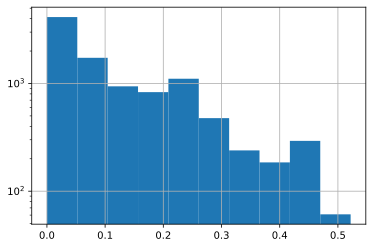

In [267]:
df_train.Ecology_1.hist(log=True)

In [268]:
df_train.Ecology_1.quantile(.025), df_train.Ecology_1.quantile(.975)

(0.0, 0.43788525462150574)

In [269]:
eco1_outlier_cond = \
    (df_train.Ecology_1 < df_train.Ecology_1.quantile(.025)) \
    | (df_train.Ecology_1 > df_train.Ecology_1.quantile(.975))
df_train = fit_feature(df_train, 'Ecology_1', eco1_outlier_cond, suffix='outlier')

Feature: Ecology_1, outliers: 1.59% (159/10000)


In [270]:
df_train.Ecology_1.mean(), \
df_train.Ecology_1.quantile(.5), \
df_train.shape[0]

(0.11885839700698853, 0.07542368024587631, 10000)

### Social_1

In [271]:
df_train.Social_1.describe()

count    10000.000000
mean        24.687000
std         17.532614
min          0.000000
25%          6.000000
50%         25.000000
75%         36.000000
max         74.000000
Name: Social_1, dtype: float64

In [272]:
df_train.Social_1.quantile(.025), df_train.Social_1.quantile(.975)

(1.0, 66.0)

In [273]:
social1_outlier_cond = \
    (df_train.Social_1 < df_train.Social_1.quantile(.025)) \
    | (df_train.Social_1 > df_train.Social_1.quantile(.975))
df_train = fit_feature(df_train, 'Social_1', social1_outlier_cond, suffix='outlier')

Feature: Social_1, outliers: 3.77% (377/10000)


In [274]:
df_train.loc[social1_outlier_cond, 'Social_1'] = df_train.Social_1.median()

In [275]:
df_train.Social_1.mean(), \
df_train.Social_1.quantile(.5), \
df_train.shape[0]

(24.3271, 25.0, 10000)

### Social_2

In [276]:
df_train.Social_2.describe()

count    10000.000000
mean      5352.157400
std       4006.799803
min        168.000000
25%       1564.000000
50%       5285.000000
75%       7227.000000
max      19083.000000
Name: Social_2, dtype: float64

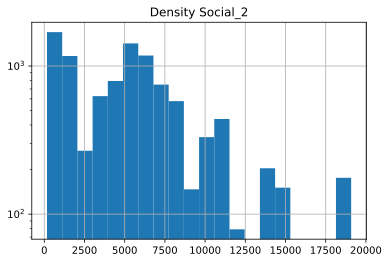

In [277]:
df_train.Social_2.hist(log=True, bins=20)
plt.title('Density Social_2')
plt.show()

In [278]:
df_train.Social_2.value_counts()

264     587
1564    511
629     486
1437    346
6398    245
       ... 
568       3
1423      3
662       2
507       1
528       1
Name: Social_2, Length: 142, dtype: int64

In [279]:
df_train.Social_2.quantile(.025), df_train.Social_2.quantile(.975)

(264.0, 14892.0)

In [280]:
social2_outlier_cond = \
    (df_train.Social_2 < df_train.Social_2.quantile(.025)) \
    | (df_train.Social_2 > df_train.Social_2.quantile(.975))
df_train = fit_feature(df_train, 'Social_2', social2_outlier_cond, suffix='outlier')

Feature: Social_2, outliers: 3.77% (377/10000)


In [281]:
df_train.loc[social2_outlier_cond, 'Social_2'] = df_train.Social_2.median()

In [282]:
df_train.Social_2.mean(), \
df_train.Social_2.quantile(.5), \
df_train.shape[0]

(5212.1445, 5285.0, 10000)

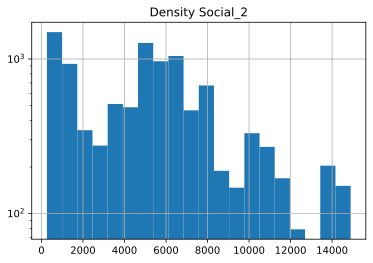

In [283]:
df_train.Social_2.hist(log=True, bins=20)
plt.title('Density Social_2')
plt.show()

### Social_3

In [284]:
df_train.Social_3.describe()

count    10000.000000
mean         8.039200
std         23.831875
min          0.000000
25%          0.000000
50%          2.000000
75%          5.000000
max        141.000000
Name: Social_3, dtype: float64

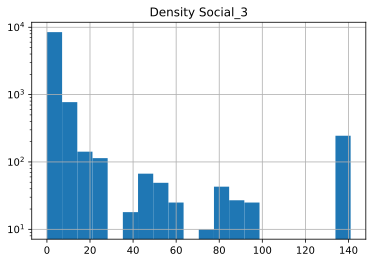

In [285]:
df_train.Social_3.hist(log=True, bins=20)
plt.title('Density Social_3')
plt.show()

In [286]:
df_train.Social_3.value_counts()

0      2997
1      1861
3      1136
4       835
2       635
6       423
5       391
141     245
9       192
7       184
11      172
8       170
10      142
16      101
14       97
27       59
48       58
56       49
84       43
24       37
87       27
59       25
93       25
19       22
20       19
23       18
39       15
73       10
45        9
37        3
Name: Social_3, dtype: int64

In [287]:
df_train.Social_3.quantile(.025), df_train.Social_3.quantile(.975)

(0.0, 93.0)

In [288]:
social3_outlier_cond = \
    (df_train.Social_3 < df_train.Social_3.quantile(.025)) \
    | (df_train.Social_3 > df_train.Social_3.quantile(.975))
df_train = fit_feature(df_train, 'Social_3', social3_outlier_cond, suffix='outlier')

Feature: Social_3, outliers: 2.45% (245/10000)


In [289]:
df_train.Social_3.mean(), \
df_train.Social_3.quantile(.5), \
df_train.shape[0]

(8.0392, 2.0, 10000)

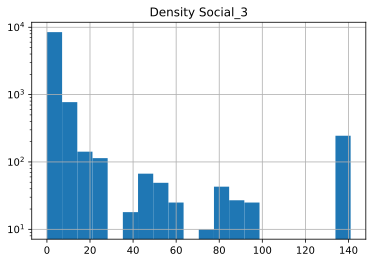

In [290]:
df_train.Social_3.hist(log=True, bins=20)
plt.title('Density Social_3')
plt.show()

### Healthcare_1

In [291]:
df_train.Healthcare_1.describe()

count    5202.000000
mean     1142.904419
std      1021.519470
min         0.000000
25%       350.000000
50%       900.000000
75%      1548.000000
max      4849.000000
Name: Healthcare_1, dtype: float64

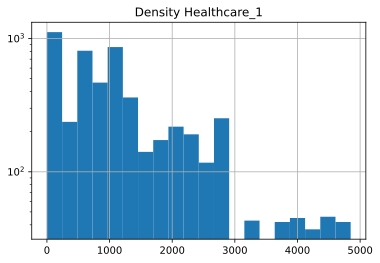

In [292]:
df_train.Healthcare_1.hist(log=True, bins=20)
plt.title('Density Healthcare_1')
plt.show()

### Helthcare_2

In [293]:
df_train.Helthcare_2.describe()

count    10000.000000
mean         1.319500
std          1.493601
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          6.000000
Name: Helthcare_2, dtype: float64

In [294]:
df_train.Helthcare_2.value_counts()

0    4214
1    2183
3    1670
2    1158
5     388
4     288
6      99
Name: Helthcare_2, dtype: int64

### Shops_1

In [295]:
df_train.Shops_1.describe()

count    10000.000000
mean         4.231300
std          4.806341
min          0.000000
25%          1.000000
50%          3.000000
75%          6.000000
max         23.000000
Name: Shops_1, dtype: float64

In [296]:
df_train.Shops_1.value_counts()

0     2316
1     1325
5     1324
2      964
4      841
3      711
6      487
11     401
9      316
7      294
8      253
23     245
10     215
15     176
16      83
19      49
Name: Shops_1, dtype: int64

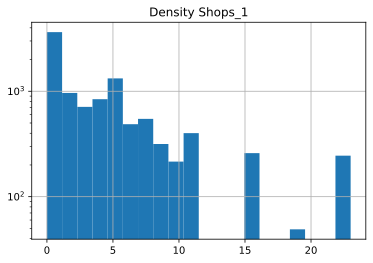

In [297]:
df_train.Shops_1.hist(log=True, bins=20)
plt.title('Density Shops_1')
plt.show()

## Обработка пропусков

In [298]:
df_train.isna().sum()

Id                       0
DistrictId               0
Rooms                    0
Square                   0
LifeSquare            2113
Floor                    0
HouseFloor               0
HouseYear                0
Ecology_1                0
Ecology_2                0
Ecology_3                0
Social_1                 0
Social_2                 0
Social_3                 0
Healthcare_1          4798
Helthcare_2              0
Shops_1                  0
Shops_2                  0
Price                    0
Rooms_outlier            0
cat_Square               0
Square_outlier           0
LifeSquare_outlier       0
Floor_outlier            0
HouseFloor_outlier       0
HouseYear_outlier        0
Ecology_1_outlier        0
Social_1_outlier         0
Social_2_outlier         0
Social_3_outlier         0
dtype: int64

### LifeSquare

In [299]:
lsquare_nan_cond = df_train.LifeSquare.isna()

lsquare_include_nan_columns = [
    'Rooms',       #
    'Square',      #
    'LifeSquare',  #
    'Floor',
    'HouseFloor',
    'HouseYear',
    'Ecology_1',
    'Social_1',
    'Social_2',
    'Social_3',
    'Shops_1',
]

In [300]:
df_train = fit_feature(df_train, 'LifeSquare', lsquare_nan_cond, suffix='nan')

Feature: LifeSquare, outliers: 21.13% (2113/10000)


In [301]:
df_nan_lsquare = df_train.loc[~lsquare_nan_cond, lsquare_include_nan_columns]

In [302]:
X_ls_nan_train, X_ls_nan_test, y_ls_nan_train, y_ls_nan_test = train_test_split(
    df_nan_lsquare.drop(columns=['LifeSquare']),
    df_nan_lsquare.LifeSquare,
    test_size=.3,
    random_state=RANDOM_STATE,
    shuffle=True,
)

пробуем линейную регрессию

In [303]:
lr_nan_model = LinearRegression(normalize=True)
fitted_lr_nan_model = lr_nan_model.fit(X_ls_nan_train, y_ls_nan_train)

Train metrics
R2:	0.775
RMSE:	6.336
MSE:	40.142

Test metrics
R2:	0.793
RMSE:	6.06
MSE:	36.727



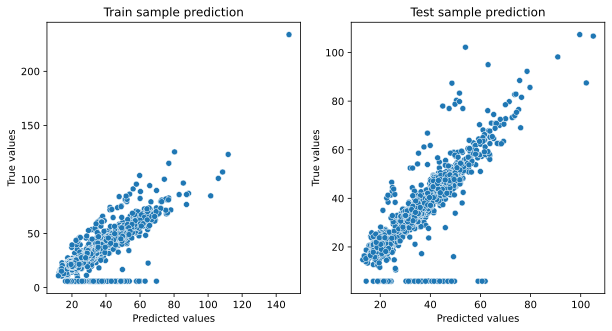

In [304]:
evaluate_preds(
    y_ls_nan_train, fitted_lr_nan_model.predict(X_ls_nan_train),
    y_ls_nan_test, fitted_lr_nan_model.predict(X_ls_nan_test),
)

пробуем случайный лес

In [305]:
rf_nan_model = RandomForestRegressor(
    n_estimators=60,
    max_depth=5,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
fitted_rf_nan_model = rf_nan_model.fit(X_ls_nan_train, y_ls_nan_train)

Train metrics
R2:	0.814
RMSE:	5.759
MSE:	33.171

Test metrics
R2:	0.797
RMSE:	5.997
MSE:	35.959



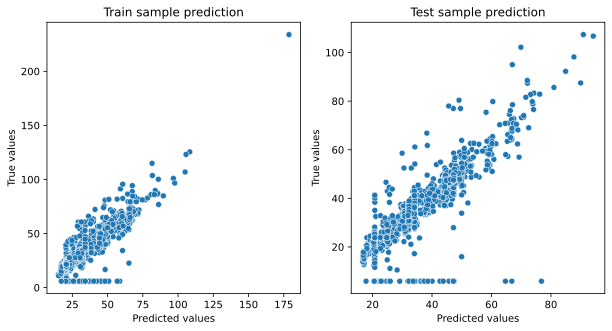

In [306]:
evaluate_preds(
    y_ls_nan_train, fitted_rf_nan_model.predict(X_ls_nan_train),
    y_ls_nan_test, fitted_rf_nan_model.predict(X_ls_nan_test),
)

для исправления пропусков выбираем модель LR как наименее ресурсоемкую

In [307]:
lifesquare_nan_dataset = df_train.loc[
    lsquare_nan_cond,
    lsquare_include_nan_columns
]

In [308]:

df_train.loc[lsquare_nan_cond, 'LifeSquare'] = \
    fitted_lr_nan_model.predict(
        lifesquare_nan_dataset.drop(columns=['LifeSquare'])
    ).reshape(-1, 1)

### Healthcare_1

In [309]:
hc1_nan_pred_cond = df_train.Healthcare_1.isna()

In [310]:
df_train = fit_feature(df_train, 'Healthcare_1', hc1_nan_pred_cond, suffix='nan')

Feature: Healthcare_1, outliers: 47.98% (4798/10000)


In [311]:
hc1_nan_pred_features = [
    'Square',
    'LifeSquare',
    'HouseFloor',
    'HouseYear',
    'Ecology_1',
    'Social_3',
    'Healthcare_1',
    'Helthcare_2',
    'Shops_1',
    'Price',
]
hc1_nan_pred_df = df_train.loc[~hc1_nan_pred_cond, hc1_nan_pred_features]

Train metrics
R2:	0.127
RMSE:	948.614
MSE:	899868.43

Test metrics
R2:	0.135
RMSE:	963.127
MSE:	927613.042



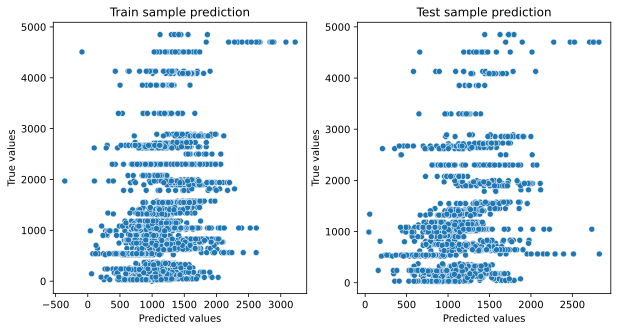

In [312]:
X_hc1_nan_train, X_hc1_nan_test, y_hc1_nan_train, y_hc1_nan_test = train_test_split(
    hc1_nan_pred_df.drop(columns='Healthcare_1'),
    hc1_nan_pred_df.Healthcare_1,
    test_size=.3,
    random_state=RANDOM_STATE,
)

hc1_nan_lr = LinearRegression(normalize=True)
hc1_nan_lr_model = hc1_nan_lr.fit(X_hc1_nan_train, y_hc1_nan_train)

evaluate_preds(
    y_hc1_nan_train, hc1_nan_lr_model.predict(X_hc1_nan_train),
    y_hc1_nan_test, hc1_nan_lr_model.predict(X_hc1_nan_test),
)

пробуем случайный лес

Train metrics
R2:	1.0
RMSE:	8.299
MSE:	68.88

Test metrics
R2:	1.0
RMSE:	11.1
MSE:	123.213



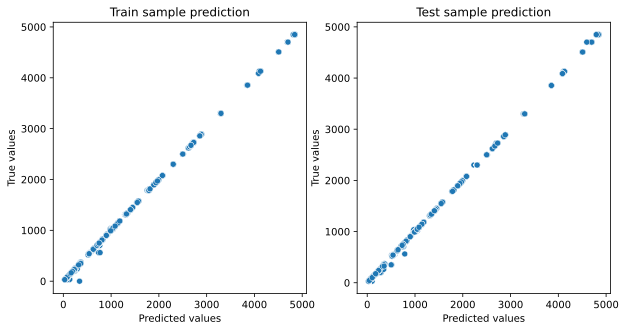

In [313]:
hc1_nan_rf = RandomForestRegressor(
    n_estimators=500,
    max_depth=17,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
hc1_nan_rf_model = hc1_nan_rf.fit(X_hc1_nan_train, y_hc1_nan_train)

evaluate_preds(
    y_hc1_nan_train, hc1_nan_rf_model.predict(X_hc1_nan_train),
    y_hc1_nan_test, hc1_nan_rf_model.predict(X_hc1_nan_test),
)

для исправления пропусков выбираем модель случайного леса

In [314]:
hc1_nan_dataset = df_train.loc[
    hc1_nan_pred_cond,
    hc1_nan_pred_features,
]

In [315]:
df_train.loc[hc1_nan_pred_cond, 'Healthcare_1'] = \
    hc1_nan_rf_model.predict(
        hc1_nan_dataset.drop(columns=['Healthcare_1'])
    ).reshape(-1, 1)

In [316]:
df_train.isna().sum()

Id                    0
DistrictId            0
Rooms                 0
Square                0
LifeSquare            0
Floor                 0
HouseFloor            0
HouseYear             0
Ecology_1             0
Ecology_2             0
Ecology_3             0
Social_1              0
Social_2              0
Social_3              0
Healthcare_1          0
Helthcare_2           0
Shops_1               0
Shops_2               0
Price                 0
Rooms_outlier         0
cat_Square            0
Square_outlier        0
LifeSquare_outlier    0
Floor_outlier         0
HouseFloor_outlier    0
HouseYear_outlier     0
Ecology_1_outlier     0
Social_1_outlier      0
Social_2_outlier      0
Social_3_outlier      0
LifeSquare_nan        0
Healthcare_1_nan      0
dtype: int64

In [317]:
def _mark_feature(X, feature, cond, suffix):
    X = X.copy()
    outliers = X[cond].shape[0]
    total_lines = X.shape[0]

    outlier_feature = f"{feature}_{suffix}"

    if outlier_feature not in X.columns:
        X[outlier_feature] = 0

    if outliers > 0:
        X.loc[cond & (X[outlier_feature] == 0), outlier_feature] = 1

    return X


class DataPreprocessing:
    MIN_ROOMS = 0
    MAX_ROOMS = 5
    MIN_SQUARE = 20
    MAX_SQUARE = 300

    def __init__(self):
        self.medians = None
        self.quantiles_025 = None
        self.quantiles_975 = None
        self.real_feature_names = None
        self.valid_feature_types = None

    @staticmethod
    def outlier_mark_feature(X, feature, cond):
        return _mark_feature(X, feature, cond, 'outlier')

    @staticmethod
    def nan_mark_feature(X, feature, cond):
        return _mark_feature(X, feature, cond, 'nan')

    def fit(self, X: pd.DataFrame):
        self.medians = X.median()
        self.quantiles_025 = X.quantile(.025)
        self.quantiles_975 = X.quantile(.975)
        self.real_feature_names = X.drop('Price', axis=1, errors='ignore').\
            select_dtypes(exclude=['category', 'object']).columns.tolist()
        self.valid_feature_types = {
            'Id': str,
            'DistrictId': str,
            'Rooms': np.uint8,
            'HouseFloor': np.uint8,
        }



    def transform(self, X: pd.DataFrame):
        X = X.copy()

        X = X.astype(self.valid_feature_types)

        # Rooms
        rooms_outlier_cond = (X.Rooms <= self.MIN_ROOMS) | (X.Rooms > self.MAX_ROOMS)
        X = self.outlier_mark_feature(X, 'Rooms', rooms_outlier_cond)

        X['cat_Square'] = X.Square // 10 * 10
        square_cond = (X.Square >= self.MIN_SQUARE) & (X.Square <= self.MAX_SQUARE)
        med_rooms_map = X[~rooms_outlier_cond & square_cond] \
            .groupby('cat_Square').agg({'Rooms': 'median'}).to_dict()['Rooms']

        X.loc[rooms_outlier_cond, 'Rooms'] = \
            X[rooms_outlier_cond].cat_Square.map(med_rooms_map)

        X.Rooms.fillna(self.medians.Rooms, inplace=True)

        # Square
        square_outlier_cond = (X.Square < self.MIN_SQUARE) | (X.Square >= self.MAX_SQUARE)
        X = self.outlier_mark_feature(X, 'Square', square_outlier_cond)

        med_square_map = X[~square_outlier_cond] \
            .groupby('Rooms').agg({'Square': 'median'}).to_dict()['Square']

        X.loc[square_outlier_cond, 'Square'] = \
            X[square_outlier_cond].Rooms.map(med_square_map)

        X.Square.fillna(self.medians.Rooms, inplace=True)

        # LifeSquare
        # X.LifeSquare < X.LifeSquare.quantile(.025) case
        ls_lt_q025_outlier_cond = (X.LifeSquare < self.quantiles_025.LifeSquare)
        X = self.outlier_mark_feature(X, 'LifeSquare', ls_lt_q025_outlier_cond)
        X.loc[ls_lt_q025_outlier_cond, 'LifeSquare'] = self.quantiles_025.LifeSquare

        # df_train.LifeSquare > df_train.Square case
        ls_gt_outlier_cond = X.LifeSquare > (X.Square - 5)
        X = self.outlier_mark_feature(X, 'LifeSquare', ls_gt_outlier_cond)

        lsquare_valid_cond = \
            ~ls_gt_outlier_cond \
            & (X.Rooms_outlier == 0) \
            & (X.Square_outlier == 0) \
            & (X.LifeSquare_outlier == 0) \
            & (~X.Square.isna()) \
            & (~X.LifeSquare.isna())

        ls_outlier_df = X.loc[lsquare_valid_cond, ['Rooms', 'Square', 'LifeSquare']]

#         lr_model = LinearRegression(normalize=True)
        rf_model = RandomForestRegressor(
            n_estimators=90,
            max_depth=9,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )
        ls_rf_model = rf_model.fit(
            ls_outlier_df.drop(columns=['LifeSquare']),
            ls_outlier_df.LifeSquare
        )
        X.loc[ls_gt_outlier_cond, 'LifeSquare'] = \
            ls_rf_model.predict(X.loc[ls_gt_outlier_cond, ['Rooms', 'Square']])

        X.loc[X.LifeSquare > (X.Square - 5), 'LifeSquare'] = self.medians.LifeSquare

        # Floor
        floor_gt_hfloors_outlier_cond = X.Floor > X.HouseFloor
        X = self.outlier_mark_feature(X, 'Floor', floor_gt_hfloors_outlier_cond)
        X.loc[floor_gt_hfloors_outlier_cond, ['Floor', 'HouseFloor']] = \
            X.loc[floor_gt_hfloors_outlier_cond, ['HouseFloor', 'Floor']].values

        # HouseFloor
        # (X.HouseFloor <= 0) | (X.HouseFloor > 50) cases
        hfloor_outliers_cond = (X.HouseFloor <= 0) | (X.HouseFloor > 50)
        X = self.outlier_mark_feature(X, 'HouseFloor', hfloor_outliers_cond)
        X.loc[hfloor_outliers_cond, 'HouseFloor'] = self.medians.HouseFloor

        # HouseYear
        hyear_outlier_cond = X.HouseYear > 2020
        X = self.outlier_mark_feature(X, 'HouseYear', hyear_outlier_cond)
        X.loc[hyear_outlier_cond, 'HouseYear'] = self.medians.HouseYear

        # Ecology_1
        eco1_outlier_cond = \
            (X.Ecology_1 < self.quantiles_025.Ecology_1) \
            | (X.Ecology_1 > self.quantiles_975.Ecology_1)
        X = self.outlier_mark_feature(X, 'Ecology_1', eco1_outlier_cond)

        # Social_X
        for i in (1, 2, 3):
            social_outlier_cond = \
                (X[f'Social_{i}'] < self.quantiles_025[f'Social_{i}']) \
                | (X[f'Social_{i}'] > self.quantiles_975[f'Social_{i}'])

            X = self.outlier_mark_feature(X, f'Social_{i}', social_outlier_cond)

        # Обработка пропусков
        # LifeSquare
        ls_nan_pred_cond = X.LifeSquare.isna()

        ls_nan_pred_features = [
            'Rooms', 'Square', 'Floor', 'HouseFloor', 'HouseYear',
            'Ecology_1', 'Social_1', 'Social_2', 'Social_3', 'Shops_1',
        ]

        X = self.nan_mark_feature(X, 'LifeSquare', ls_nan_pred_cond)

        lr_model = LinearRegression(normalize=True)

        ls_lr_nan_model = lr_model.fit(
            X.loc[~ls_nan_pred_cond, ls_nan_pred_features],
            X[~ls_nan_pred_cond].LifeSquare
        )
        X.loc[ls_nan_pred_cond, 'LifeSquare'] = \
            ls_lr_nan_model.predict(
                X.loc[ls_nan_pred_cond, ls_nan_pred_features]
            ).reshape(-1, 1)

        # Healthcare_1
        hc1_nan_pred_cond = X.Healthcare_1.isna()

        X = self.nan_mark_feature(X, 'Healthcare_1', hc1_nan_pred_cond)

        hc1_nan_pred_features = [
            'Square', 'LifeSquare', 'HouseFloor', 'HouseYear',
            'Ecology_1', 'Social_3', 'Helthcare_2', 'Shops_1',
        ]

        rf_model = RandomForestRegressor(
            n_estimators=500,
            max_depth=17,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )

        hc1_nan_rf_model = rf_model.fit(
            X.loc[~hc1_nan_pred_cond, hc1_nan_pred_features],
            X[~hc1_nan_pred_cond].Healthcare_1,
        )

        X.loc[hc1_nan_pred_cond, 'Healthcare_1'] = \
            hc1_nan_rf_model.predict(
                X.loc[hc1_nan_pred_cond, hc1_nan_pred_features],
            ).reshape(-1, 1)
        
        return X
  

In [318]:
m = DataPreprocessing()

In [319]:
x = pd.read_csv(TRAIN_DATASET_FILE)
m.fit(x)

In [320]:
x = m.transform(x)

In [321]:
real_feature_names = x.drop('Price', axis=1, errors='ignore').\
    select_dtypes(exclude=['category', 'object']).columns.tolist()

pd.DataFrame(MinMaxScaler().fit_transform(x[real_feature_names]), columns=real_feature_names).isna().sum()

Rooms                 0
Square                0
LifeSquare            0
KitchenSquare         0
Floor                 0
HouseFloor            0
HouseYear             0
Ecology_1             0
Social_1              0
Social_2              0
Social_3              0
Healthcare_1          0
Helthcare_2           0
Shops_1               0
Rooms_outlier         0
cat_Square            0
Square_outlier        0
LifeSquare_outlier    0
Floor_outlier         0
HouseFloor_outlier    0
HouseYear_outlier     0
Ecology_1_outlier     0
Social_1_outlier      0
Social_2_outlier      0
Social_3_outlier      0
LifeSquare_nan        0
Healthcare_1_nan      0
dtype: int64

## Генерация новых признаков

### Dummies

In [322]:
binary_to_numbers = {'A': 0, 'B': 1}

df_train['Ecology_2'] = df_train['Ecology_2'].map(binary_to_numbers)
df_train['Ecology_3'] = df_train['Ecology_3'].map(binary_to_numbers)
df_train['Shops_2'] = df_train['Shops_2'].map(binary_to_numbers)

### DistrictId

### district_sale_popularity

In [323]:
DISTRICT_POPULARITY_MAPPER = {
    'DistrictId': 'district_sale_popularity',
    'index': 'DistrictId',
}

district_sale_popularity = df_train.groupby('DistrictId').\
    agg({'DistrictId': 'count'}).rename(columns=DISTRICT_POPULARITY_MAPPER)

df_train = df_train.merge(district_sale_popularity, how='left', on='DistrictId')
df_train.district_sale_popularity.fillna(-1, inplace=True)

In [324]:
DISTRICT_PRICE_MAPPER = {'Price': 'mean_district_price'}

mean_district_price = df_train.groupby('DistrictId', as_index=False).\
    agg({'Price': 'mean'}).rename(columns=DISTRICT_PRICE_MAPPER)

df_train = df_train.merge(mean_district_price, how='left', on='DistrictId')
df_train.mean_district_price.fillna(-1, inplace=True)

In [325]:
class FeatureGenetator:
    """Генерация новых фич"""
    DUMMY_FEATURES = ['Ecology_2', 'Ecology_3', 'Shops_2']

    CTN_MAPPER = {
        'A': 0,
        'B': 1,
    }

    DISTRICT_POPULARITY_MAPPER = {
        'DistrictId': 'district_sale_popularity',
        'index': 'DistrictId',
    }

    DISTRICT_PRICE_MAPPER = {
        'Price': 'mean_district_price',
    }

    def __init__(self):
        self.district_sale_popularity = None
        self.mean_district_price = None
        self.price_per_room = None
        self.price_per_square = None
    
    def fit(self, X, y=None):
        X = X.copy()
        
        self.district_sale_popularity = \
            X.DistrictId.value_counts().reset_index().rename(columns=self.DISTRICT_POPULARITY_MAPPER)

        if y is not None:
            X['Price'] = y.values
            
            self.mean_district_price = \
                X.groupby('DistrictId', as_index=False).agg({'Price': 'mean'}).\
                rename(columns=self.DISTRICT_PRICE_MAPPER)
            

            
    def transform(self, X):
        X = X.copy()
        df = X[['DistrictId']]
        
        for f in self.DUMMY_FEATURES:
            X[f] = X[f].map(self.CTN_MAPPER)

        X = X.merge(self.district_sale_popularity, how='left', on='DistrictId')
        X.district_sale_popularity.fillna(-1, inplace=True)
        
        if self.mean_district_price is not None:
            X = X.merge(self.mean_district_price, how='left', on='DistrictId')
            X['mean_district_price'].fillna(-1, inplace=True)
        
        if self.price_per_room is not None:
            X['price_per_room'] = self.price_per_room

        if self.price_per_square is not None:
            X['price_per_square'] = self.price_per_square
        
        return X


## Отбор признаков

In [326]:
df_train.columns.tolist()

['Id',
 'DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'Rooms_outlier',
 'cat_Square',
 'Square_outlier',
 'LifeSquare_outlier',
 'Floor_outlier',
 'HouseFloor_outlier',
 'HouseYear_outlier',
 'Ecology_1_outlier',
 'Social_1_outlier',
 'Social_2_outlier',
 'Social_3_outlier',
 'LifeSquare_nan',
 'Healthcare_1_nan',
 'district_sale_popularity',
 'mean_district_price']

In [327]:
orig_features = ['Rooms', 'Square', 'LifeSquare', 'Floor', 'HouseFloor', 'HouseYear',
                 'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 
                 'Social_3', 'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2']

new_features = ['Rooms_outlier', 'cat_Square', 'Square_outlier', 'LifeSquare_outlier',
                'Floor_outlier', 'HouseFloor_outlier', 'HouseYear_outlier',
                'Ecology_1_outlier', 'Social_1_outlier', 'Social_2_outlier',
                'Social_3_outlier', 'LifeSquare_nan', 'Healthcare_1_nan',
                'district_sale_popularity', 'mean_district_price',
#                 'price_per_room', 'price_per_square'
               ]

target_feature = 'Price'

## Разбиение на train и test

In [328]:
train_df = pd.read_csv(TRAIN_DATASET_FILE)
test_df = pd.read_csv(TEST_DATASET_FILE)

X = train_df.drop(columns=target_feature)
y = train_df[target_feature]

In [329]:
X_train, X_valid, y_train, y_valid = \
    train_test_split(X, y, test_size=.3, shuffle=True, random_state=RANDOM_STATE)

In [330]:
preprocessor = DataPreprocessing()
preprocessor.fit(X_train)
X_train = preprocessor.transform(X_train)
X_valid = preprocessor.transform(X_valid)
test_df = preprocessor.transform(test_df)

In [331]:
X_train.shape, X_valid.shape, test_df.shape

((7000, 32), (3000, 32), (5000, 32))

In [332]:
features_gen = FeatureGenetator()
features_gen.fit(X_train, y_train)

X_train = features_gen.transform(X_train)
X_valid = features_gen.transform(X_valid)
test_df = features_gen.transform(test_df)

X_train.shape, X_valid.shape, test_df.shape

((7000, 34), (3000, 34), (5000, 34))

In [333]:
X_train = X_train[orig_features + new_features]
X_valid = X_valid[orig_features + new_features]
test_df = test_df[orig_features + new_features]

In [334]:
effecient_features = ['Rooms',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'cat_Square',
 'district_sale_popularity']

In [335]:
X_train.isna().sum().sum(), X_valid.isna().sum().sum(), test_df.isna().sum().sum()


(0, 0, 0)

## Обучение

Train metrics
R2:	0.678
RMSE:	52729.043
MSE:	2780352014.008

Test metrics
R2:	0.656
RMSE:	54450.062
MSE:	2964809301.454



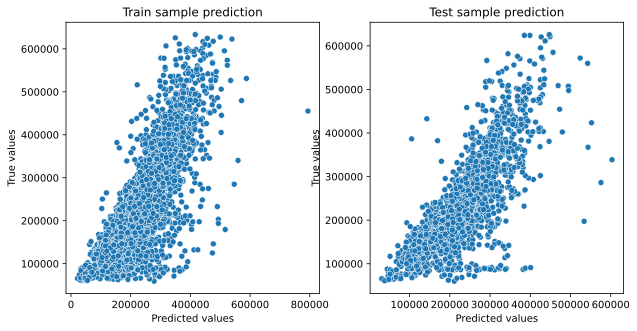

In [336]:
lr = LinearRegression()
lr_model = lr.fit(X_train, y_train)
y_train_preds = lr_model.predict(X_train)
y_test_preds = lr_model.predict(X_valid)

evaluate_preds(y_train, y_train_preds, y_valid, y_test_preds)

## Оценка модели RandomForestRegressor

In [337]:
%%time
rf_model = RandomForestRegressor(
    random_state=RANDOM_STATE,
    criterion='mse',
    max_depth=13,
    n_estimators=800,
    n_jobs=-1,
)
rf_model.fit(X_train, y_train)

Wall time: 9.51 s


RandomForestRegressor(max_depth=13, n_estimators=800, n_jobs=-1,
                      random_state=45)

Train metrics
R2:	0.933
RMSE:	24033.608
MSE:	577614323.438

Test metrics
R2:	0.733
RMSE:	48035.556
MSE:	2307414620.459



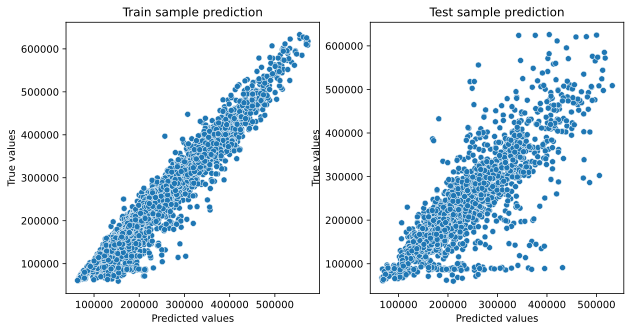

In [338]:
y_train_preds = rf_model.predict(X_train)
y_test_preds = rf_model.predict(X_valid)

evaluate_preds(y_train, y_train_preds, y_valid, y_test_preds)

## Кроссвалидация

In [339]:
cv_score = cross_val_score(
    rf_model,
    X_train,
    y_train,
    scoring='r2',
    cv=KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
)
cv_score

array([0.70592104, 0.74963357, 0.72392686, 0.75686038, 0.72788814])

In [340]:
cv_score.mean()

0.7328460000347515

## Важность признаков

In [341]:
feature_importances = pd.DataFrame(zip(X_train.columns, rf_model.feature_importances_), 
                                   columns=['feature_name', 'importance'])

feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
30,mean_district_price,3.138448e-01
1,Square,2.546408e-01
2,LifeSquare,1.989739e-01
0,Rooms,2.629237e-02
5,HouseYear,2.349628e-02
4,HouseFloor,2.283220e-02
17,cat_Square,2.043900e-02
11,Social_3,2.023775e-02
9,Social_1,2.021045e-02
12,Healthcare_1,1.866354e-02


In [342]:
impotarnt_features = feature_importances[feature_importances.importance.between(.001, .5)].feature_name.tolist()
impotarnt_features

['Rooms',
 'Square',
 'LifeSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'cat_Square',
 'Square_outlier',
 'LifeSquare_outlier',
 'Floor_outlier',
 'LifeSquare_nan',
 'Healthcare_1_nan',
 'district_sale_popularity',
 'mean_district_price']

In [343]:
test_df.shape
test_df

,Rooms,Square,LifeSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,...,HouseFloor_outlier,HouseYear_outlier,Ecology_1_outlier,Social_1_outlier,Social_2_outlier,Social_3_outlier,LifeSquare_nan,Healthcare_1_nan,district_sale_popularity,mean_district_price
0,1.0,36.847630,19.094182,5,9.0,1970.0,0.036122,1,1,24,...,0,0,0,0,0,0,0,0,71.0,238051.584554
1,1.0,42.493907,21.578826,7,17.0,2017.0,0.072158,1,1,2,...,0,0,0,0,0,0,0,1,166.0,170490.250028
2,2.0,59.463678,33.833416,19,19.0,1977.0,0.211401,1,1,9,...,0,0,0,0,0,0,1,1,573.0,156465.396420
3,3.0,49.646030,33.893825,2,2.0,1965.0,0.014073,1,1,2,...,0,0,0,0,0,0,0,1,402.0,128211.368907
4,1.0,53.837056,26.729911,8,17.0,1977.0,0.309479,1,1,35,...,0,0,0,0,0,0,1,0,78.0,206089.520932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.0,43.177521,30.339945,5,6.0,1962.0,0.069660,1,1,31,...,0,0,0,0,0,0,0,1,63.0,176218.911320
4996,3.0,93.698122,53.672468,21,27.0,2018.0,0.060753,1,1,15,...,0,0,0,0,0,0,0,0,28.0,319515.493538
4997,1.0,33.656723,19.003259,2,5.0,1966.0,0.038693,1,1,28,...,0,0,0,0,0,0,0,0,77.0,204205.468153
4998,1.0,38.635155,20.976257,8,14.0,1970.0,0.089040,1,1,33,...,0,0,0,0,0,0,0,1,38.0,238146.347649


In [347]:
submit = pd.read_csv('./sample_submission.csv')
submit.head()

,Id,Price
0,4567,200000.0
1,5925,200000.0
2,960,200000.0
3,3848,200000.0
4,746,200000.0


In [348]:
predictions = rf_model.predict(test_df)
predictions

array([169789.89624442, 129471.23467498, 139783.84016038, ...,
       147458.0015691 , 188122.43541467, 250182.65734581])

In [349]:
submit['Price'] = predictions
submit.head()

,Id,Price
0,4567,169789.896244
1,5925,129471.234675
2,960,139783.840160
3,3848,138892.536696
4,746,179890.192437


In [352]:
submit.to_csv('MGladkov_predictions.csv', index=False)